# YOLOv8 Segmentation Model for Pot-Hole Detection

####*Author: MD. Mazidur Rehman*
####*Email: mazidur.rehman@study.thws.de*
####*Version: 1.4*
####*Last Edited: 25/12/2023*

In [1]:
#Importing the required libraries/modules
!pip install ultralytics
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 395, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are ('train', 'val', 'predict', 'export', 'track', 'benchmark').

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of ('detect', 'segment', 'classify', 'pose')
                MODE (required) is one of ('train', 'val', 'predict', 'export', 'track', 'benchmark')
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at https://d

In [ ]:
#Importing DataSet from Roboflow
!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="1yi16IHpUqB7Z63M3oyg")
project = rf.workspace("sallar").project("pothole-robo")
dataset = project.version(5).download("yolov8")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0


Extracting Dataset Version Zip to Pothole-Robo-5 in yolov8:: 100%|██████████| 10120/10120 [00:02<00:00, 4390.82it/s]


In [ ]:
#Training the segmentation model using Transfer learning from yolov8s-seg.pt
!yolo task=segment mode=train model=yolov8s-seg.pt data={dataset.location}/data.yaml epochs=30 imgsz=640


Ultralytics YOLOv8.0.229 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/content/Pothole-Robo-5/data.yaml, epochs=30, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=

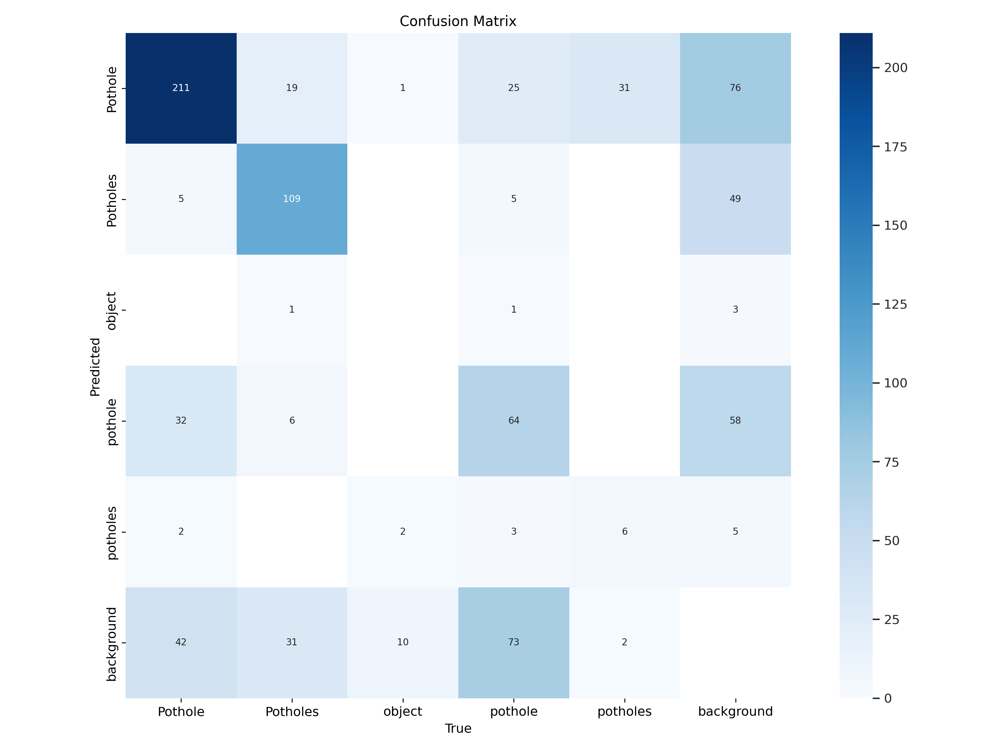

In [ ]:
#checking the prediction performance

import glob
from IPython.display import Image, display
Image(filename=f'/content/runs/segment/train2/confusion_matrix.png', width=1200)

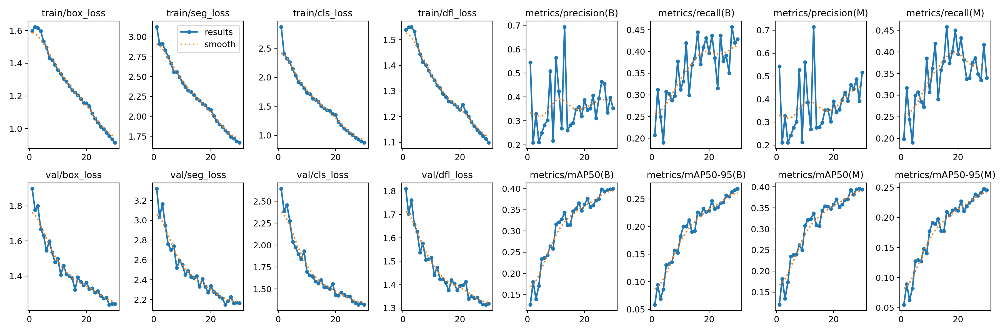

In [ ]:
#Training performance
Image(filename=f'/content/runs/segment/train2/results.png', width=1200)

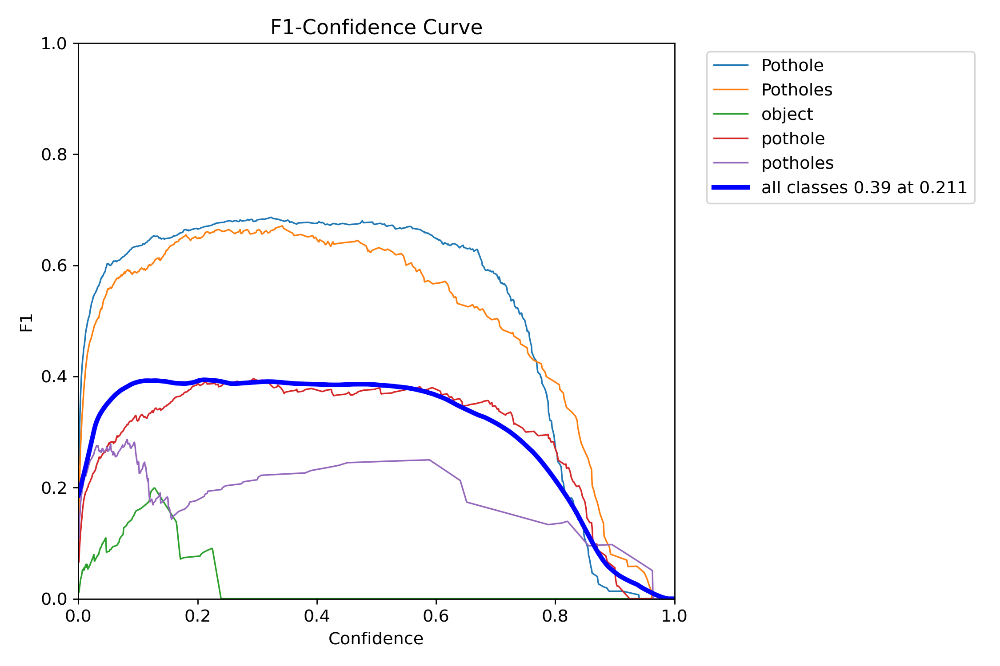

In [ ]:
#F1 Confidence Curve

import glob
from IPython.display import Image, display
Image(filename=f'/content/runs/segment/train2/BoxF1_curve.png', width=1200)

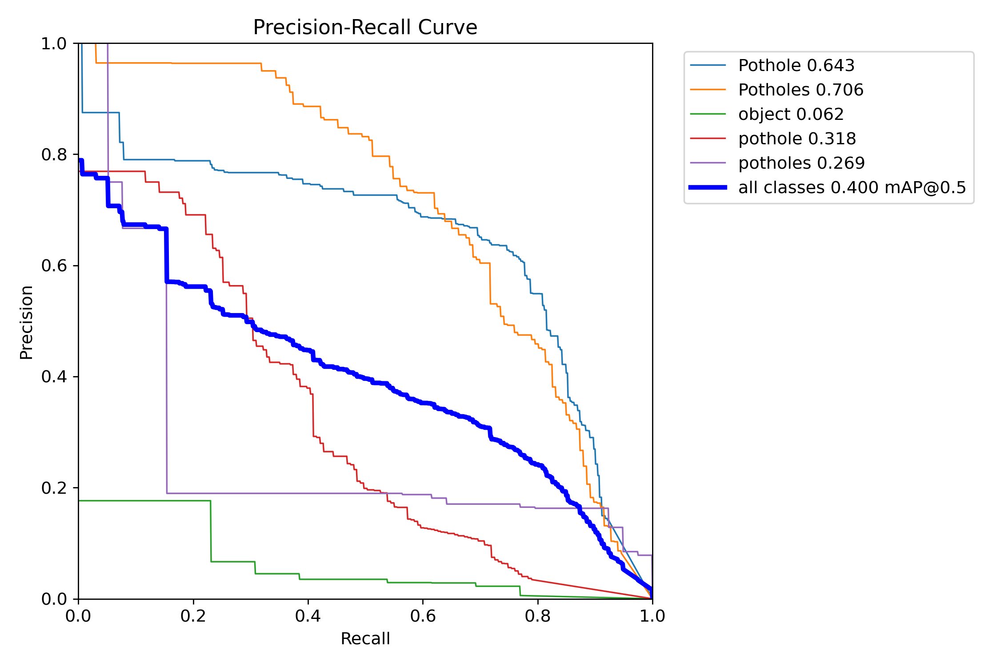

In [ ]:
#Precision - Recall curve
Image(filename=f'/content/runs/segment/train2/BoxPR_curve.png', width=1200)

In [ ]:
#Validating the model
!yolo task=detect mode=val model=/content/runs/segment/train2/weights/best.pt data={dataset.location}/data.yaml

WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics YOLOv8.0.229 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11781535 parameters, 0 gradients, 42.4 GFLOPs
val: Scanning /content/Pothole-Robo-5/valid/labels.cache... 292 images, 1 backgrounds, 0 corrupt: 100% 292/292 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 19/19 [00:10<00:00,  1.81it/s]
                   all        292        681      0.354      0.428      0.399      0.269       0.35      0.422      0.393      0.245
               Pothole        292        292      0.575      0.788       0.64      0.503      0.567      0.777      0.638      0.443
              Potholes        292        166      0.605      0.711      0.707       0.41      0.595      0.698      0.69

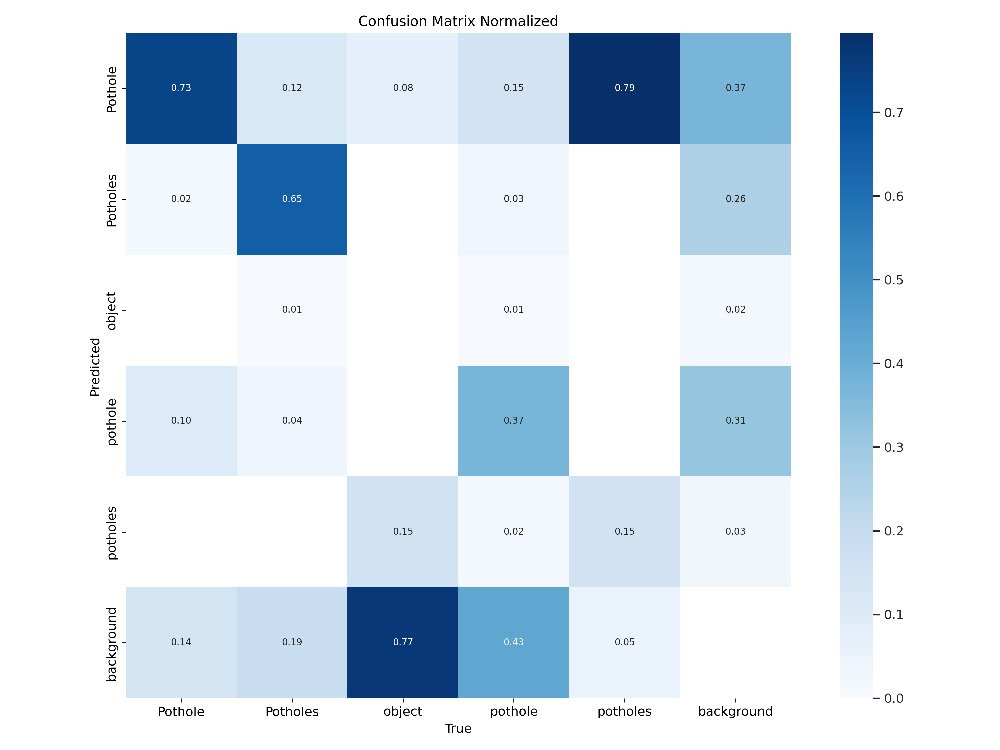

In [ ]:
# Viewing Normalised confusion matrix
Image(filename=f'/content/runs/segment/val/confusion_matrix_normalized.png', width=1200)

In [ ]:
# Viewing Validation batch results
Image(filename=f'/content/runs/segment/val/val_batch2_pred.jpg', width=1000)

TypeError: ignored

In [ ]:
#Running the predictions
!yolo task=detect mode=predict model=/content/runs/segment/train2/weights/best.pt conf=0.5 source={dataset.location}/test/images save_txt=true save_conf=true

WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics YOLOv8.0.229 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11781535 parameters, 0 gradients, 42.4 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/214 /content/Pothole-Robo-5/test/images/51_png_jpg.rf.094a513b000e37d398378489777f577e.jpg: 640x640 4 Potholess, 27.5ms
image 2/214 /content/Pothole-Robo-5/test/images/52_png_jpg.rf.a2a75ccf76a430871af3e874594d9d61.jpg: 640x640 2 Potholess, 21.0ms
image 3/214 /content/Pothole-Robo-5/test/images/533_png_jpg.rf.b9991185a0b5490537b9a080eba1b73a.jpg: 640x640 2 Potholess, 20.9ms
image 4/214 /content/Pothole-Robo-5/test/images/534_png_jpg.rf.50f4dda1b6471db41e36b30da30757a7.jpg: 640x640 2 Potholess, 20.9ms
image 5/214 /content/Pothole-Robo-5/test/images/535_png_jpg.rf.9737336628b36c0a5126a1341092bd58.jpg: 640x640 1 Potholes, 21.0ms

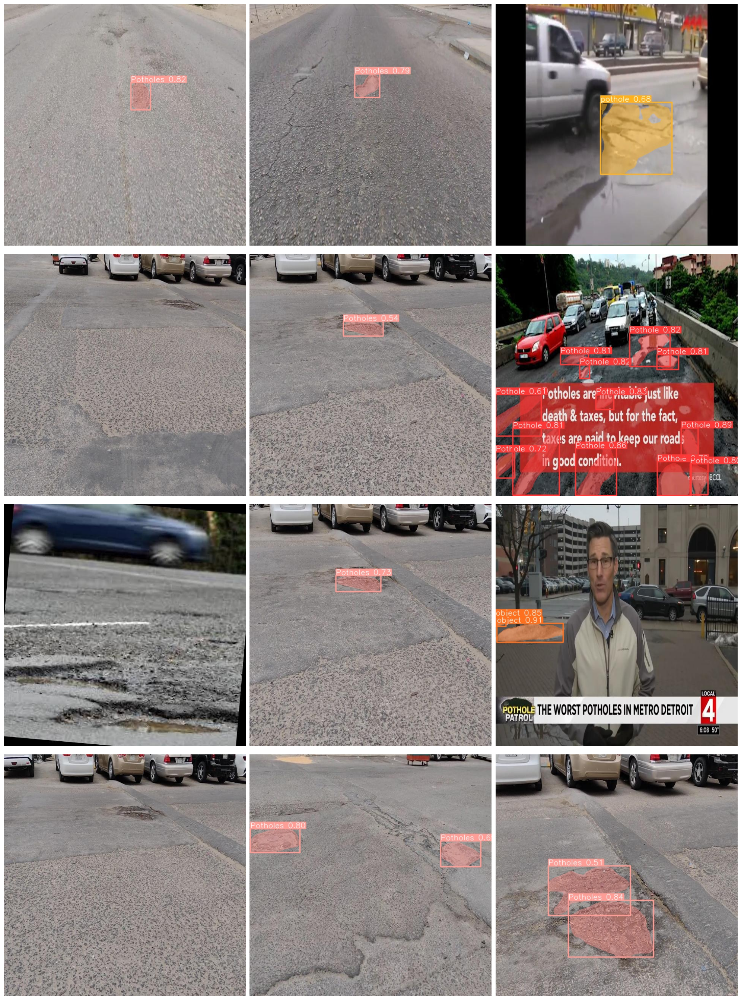

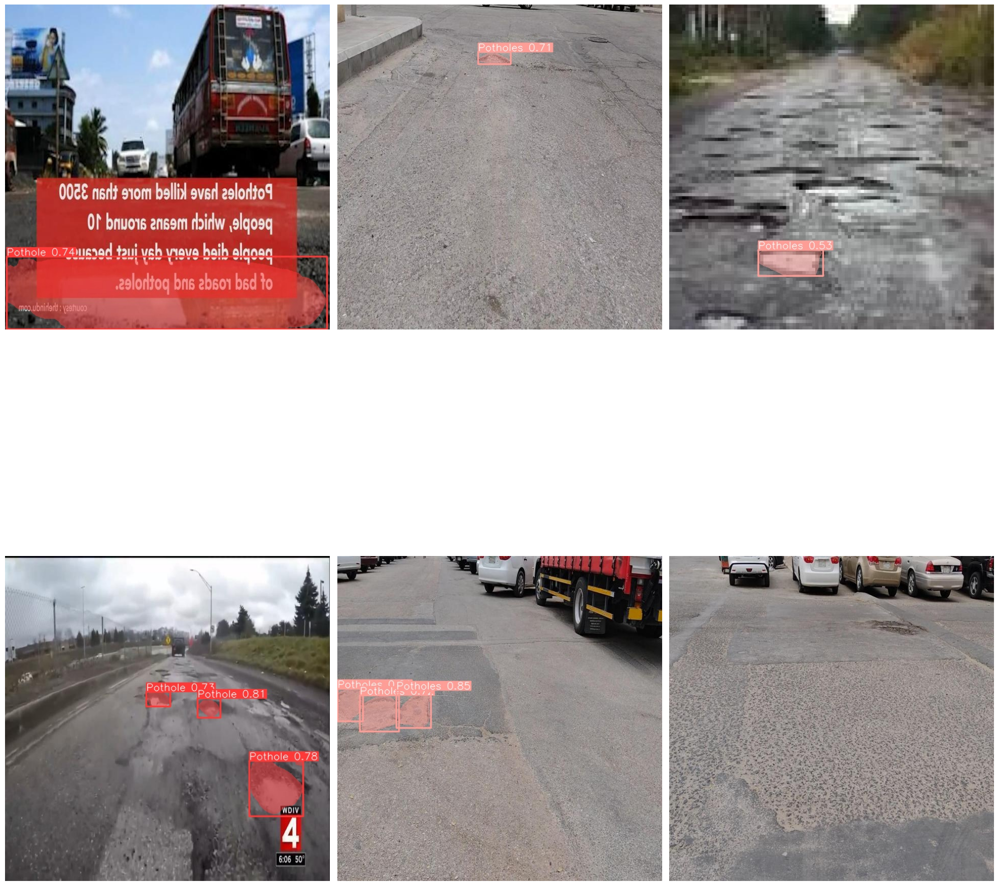

In [2]:
#Viewing the predictions with detected and segmented region along with confidence level
import matplotlib.pyplot as plt
import glob
from PIL import Image

def display_images(image_paths, start, end, images_per_row=3):
    plt.figure(figsize=(20, 27))
    for idx, image_path in enumerate(image_paths[start:end]):
        img = Image.open(image_path)
        plt.subplot((end - start - 1) // images_per_row + 1, images_per_row, idx + 1)
        plt.imshow(img)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

image_paths = glob.glob('/content/runs/segment/predict/*.jpg')
total_images = len(image_paths)
images_per_batch = 12

for i in range(0, total_images, images_per_batch):
    display_images(image_paths, i, min(i + images_per_batch, total_images))


In [ ]:
#Downloading Training Data as ZIp
import shutil
from google.colab import files

directory_to_zip = '/content/runs/segment/train2'
zip_file_name = 'PotHole_train.zip'
shutil.make_archive(zip_file_name.replace('.zip', ''), 'zip', directory_to_zip)

files.download(zip_file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#Downloading Prediction data as zip
import shutil
from google.colab import files

directory_to_zip = '/content/runs/segment/predict'
zip_file_name = 'PotHole_Predictions.zip'
shutil.make_archive(zip_file_name.replace('.zip', ''), 'zip', directory_to_zip)

files.download(zip_file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#Export the Trained model in any format other format

# Load a model
model = YOLO('/content/runs/segment/train2/weights/best.pt')  # load an official model

# Export the model in edgetpu
model.export(format='edgetpu')
print("model exported to edgetpu")

#Export the model in openvino
model.export(format='openvino')
print("model exported to openvino")

#Export the model in tensorflow
model.export(format='saved_model')
print("model exported to Tensorflow")

#Export the model in CoreML
model.export(format='coreml')
print("model exported to CoreML")

#Export the model in tflite
model.export(format='tflite')
print("model exported to Tensorflow lite")